# Experiment # 3. - UMAP as pre- and post-processing step.

**Semi-Supervised Learning with UMAP**:
- Apply Uniform Manifold Approximation and Projection (UMAP) for DR on node features before and after training a semi-supervised GNN model.
- Evaluate the model on a more complex dataset like Citeseer, focusing on the impact of DR on label propagation and the learning of node representations.

Import section:

In [ ]:
!pip install torch_geometric umap-learn

In [1]:
import torch
import torch.nn.functional as F
from torch_geometric.datasets import Coauthor
from torch_geometric.nn import GCNConv
from umap import UMAP
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm
import warnings
from utils import *

random_state = 0
random.seed(0)
torch.manual_seed(0)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
warnings.filterwarnings('ignore', message="n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.")
warnings.filterwarnings('ignore', message="Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.")
warnings.filterwarnings('ignore', message="Graph is not fully connected, spectral embedding may not work as expected.")
print("Is cuda available?", torch.cuda.is_available())

Is cuda available? True


## 1. Training the model on original features

Loading the CiteSeer dataset:

In [2]:
dataset = Coauthor(root='.', name='Physics')
data = dataset[0].to(device) # Move data to GPU

# prepare variables for further UMAP experiments
data_x_cpu = dataset[0].x.cpu().detach().numpy()
data_y_cpu = dataset[0].y.cpu().numpy()

Defining the GCN model and optimizer:

In [3]:
model = GCN(input_dim=dataset.num_node_features, hidden_dim=64, output_dim=dataset.num_classes).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

Training loop and model evaluation:

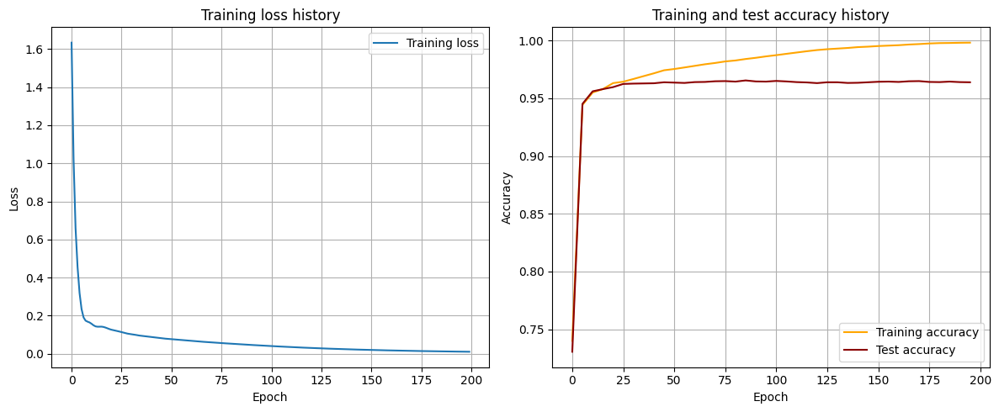

Accuracy: 0.9639, Precision: 0.9544, Recall: 0.9520, F1 score: 0.9532


In [4]:
generate_train_test(data)
n_epochs = 200
loss_history, train_acc_history, test_acc_history = train_loop(n_epochs, model, optimizer, data)

plot_training_history(loss_history, train_acc_history, test_acc_history, grid=True)

accuracy, precision, recall, f1 = evaluate_model(model, data)
print(f"Accuracy: {accuracy:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, F1 score: {f1:.4f}")

## 2. UMAP as post-processing step
In this section the UMAP visualisation is prepared using the output of the model trained on original features.

In [7]:
model = GCN(input_dim=dataset.num_node_features, hidden_dim=64, output_dim=16).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
train_loop(200, model, optimizer, data)

# Extract node representations
model.eval()
with torch.no_grad():
    embeddings = model(data)

embeddings = embeddings.cpu().numpy()

### 2.1 Default UMAP

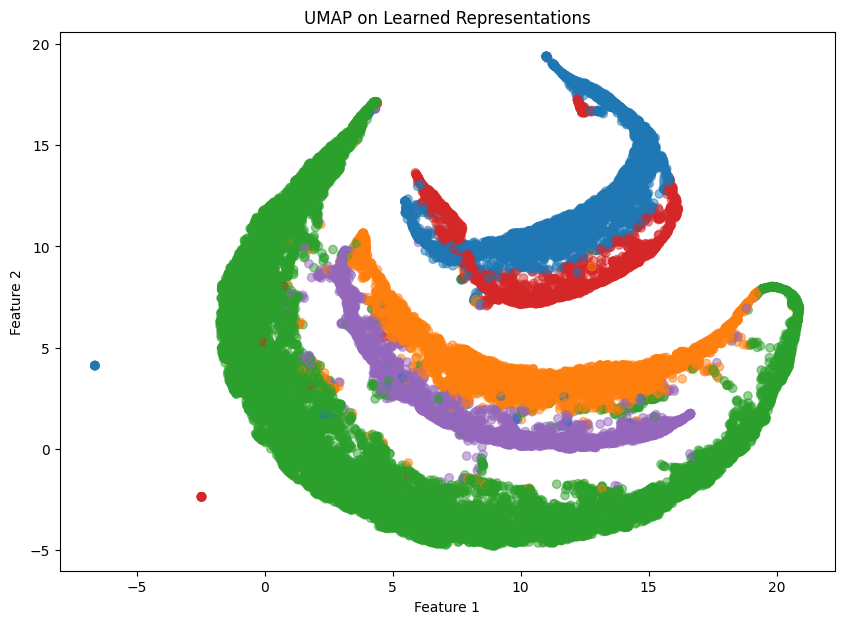

In [ ]:
# Apply UMAP on Learned Node Representations
umap_post = UMAP(n_components=2, random_state=0)
embeddings_umap_post = umap_post.fit_transform(embeddings)

visualise(embeddings_umap_post, data_y_cpu, 'UMAP on Learned Representations')

### 2.2 Fine-tuning UMAP

#### 2.2.1 metric vs min_dist vs n_neighbors

/home/asemerjak/.local/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:427: UserWarning: Exited at iteration 2000 with accuracies 
[2.12979621e-15 6.43171656e-07 1.04222931e-06 6.76931731e-06]
not reaching the requested tolerance 2.7865171432495117e-06.
Use iteration 786 instead with accuracy 
1.2250609922277565e-06.

  _, diffusion_map = lobpcg(
/home/asemerjak/.local/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:427: UserWarning: Exited postprocessing with accuracies 
[2.26815925e-15 5.61204249e-07 1.14945843e-06 3.18958129e-06]
not reaching the requested tolerance 2.7865171432495117e-06.
  _, diffusion_map = lobpcg(
/home/asemerjak/.local/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:427: UserWarning: Exited at iteration 2000 with accuracies 
[2.12979621e-15 6.43171656e-07 1.04222931e-06 6.76931731e-06]
not reaching the requested tolerance 2.7865171432495117e-06.
Use iteration 786 instead with accuracy 
1.22506099222

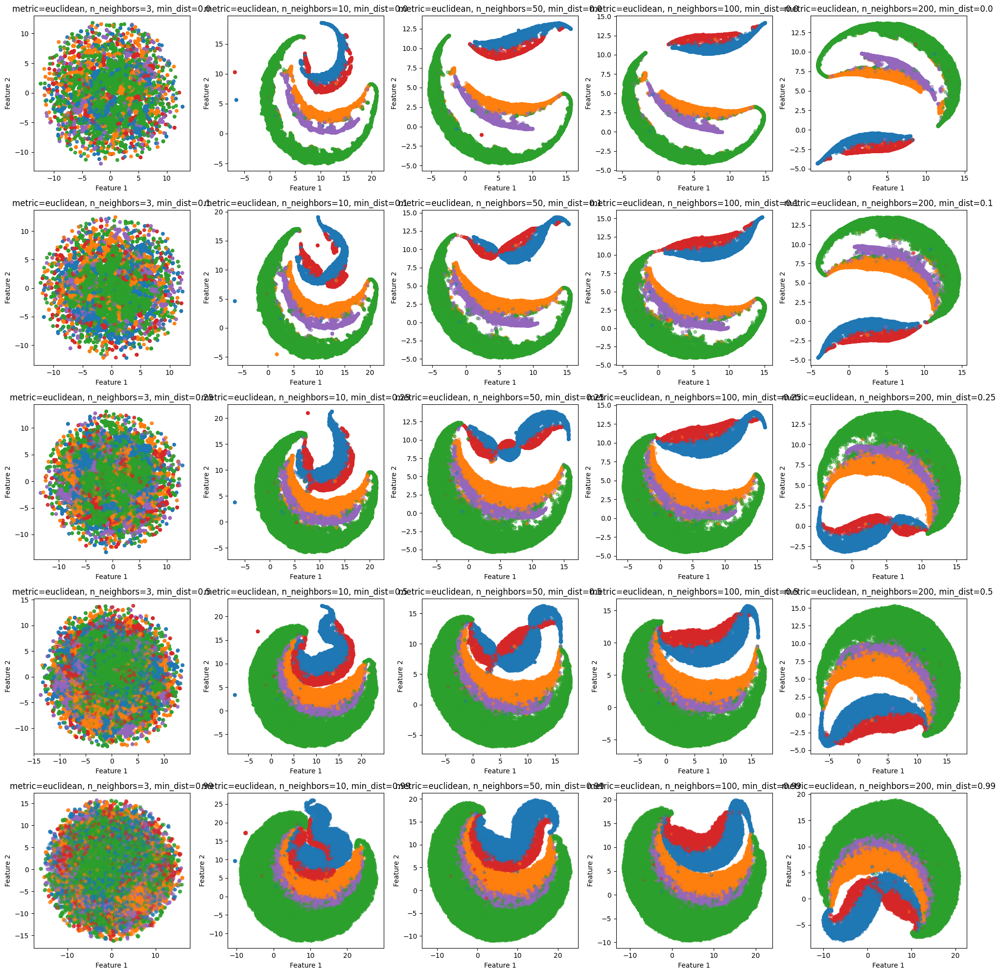

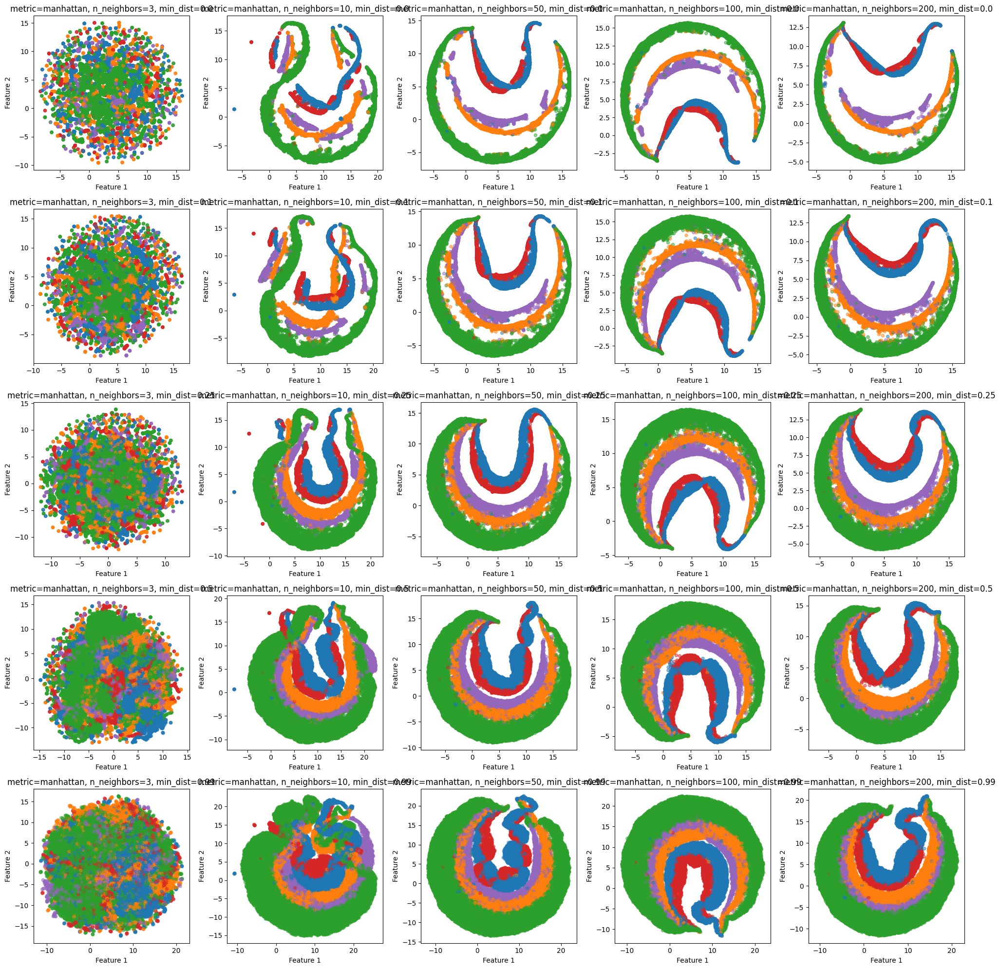

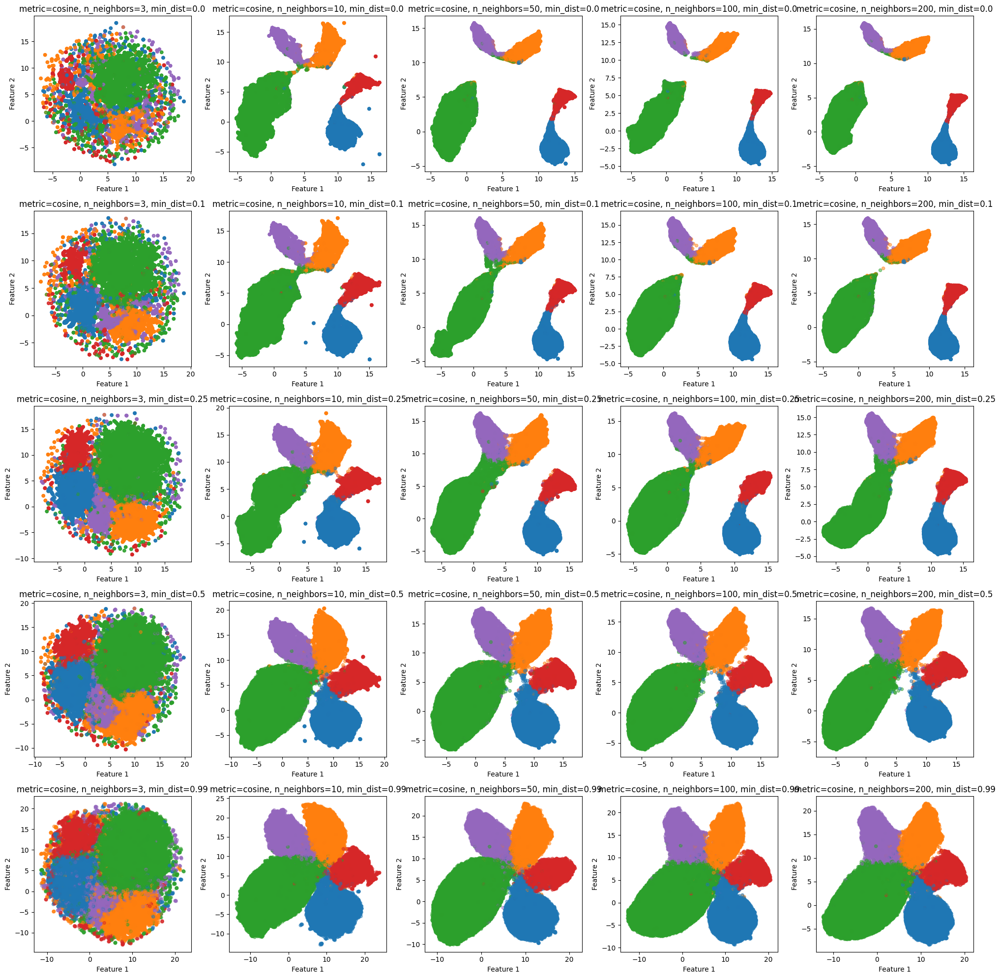

In [ ]:
for metric in ['euclidean', 'manhattan', 'cosine']:
    fig, axs = plt.subplots(5, 5, figsize=(20, 20))
    axs = axs.flatten()
    i = 0
    for min_dist in [0.0, 0.1, 0.25, 0.5, 0.99]:
        for n_neighbors in [3, 10, 50, 100, 200]:

            umap_post = UMAP(n_components=2, random_state=0, n_neighbors=n_neighbors, min_dist=min_dist, metric=metric)
            umap_results = umap_post.fit_transform(embeddings)

            plot_no_show(axs[i], umap_results, data_y_cpu, f'metric={metric}, n_neighbors={n_neighbors}, min_dist={min_dist}', size=20)

            i += 1


    plt.tight_layout()
    plt.show()

The best metric seems to be **cosine**. Let's discard n_neighbors=3 and min_dist=0 and investigate further.

**n_neighbors=50** seems to be the best paramater value and will be used from now on.

**min_dist=0.5** gives the best results.

### 2.3 Fine-tuned UMAP vs default UMAP

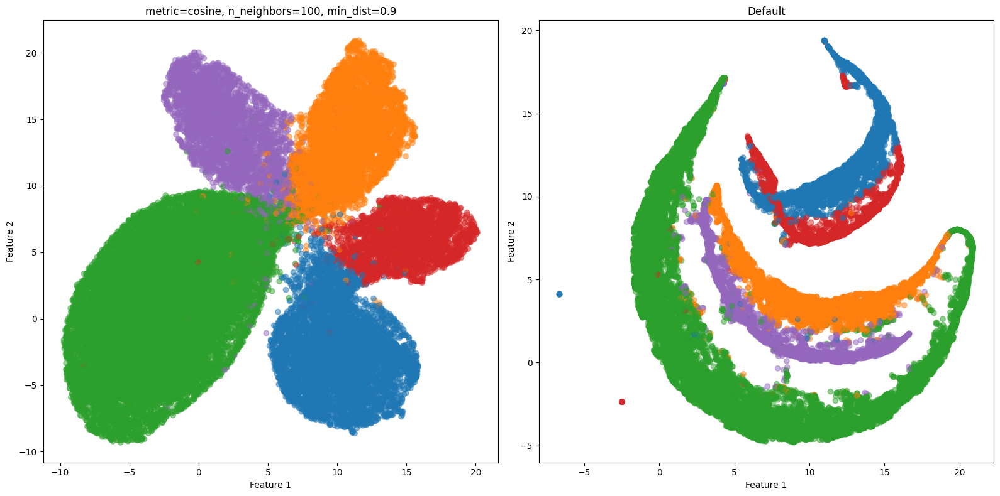

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(16, 8))

metric='cosine'
n_neighbors=100
min_dist=0.9

umap_post = UMAP(n_components=2, random_state=0, n_neighbors=n_neighbors, min_dist=min_dist, metric=metric)
umap_results = umap_post.fit_transform(embeddings)

plot_no_show(axs[0], umap_results, data_y_cpu, f'metric={metric}, n_neighbors={n_neighbors}, min_dist={min_dist}')

umap_post = UMAP(n_components=2, random_state=0)
umap_results = umap_post.fit_transform(embeddings)

plot_no_show(axs[1], umap_results, data_y_cpu, f'Default')

plt.tight_layout()
plt.show()

The results are extremely poor. Let's investigate if manipulating model parameters will improve the outcome.

## 4. UMAP on original features

### 4.1 Default umap

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


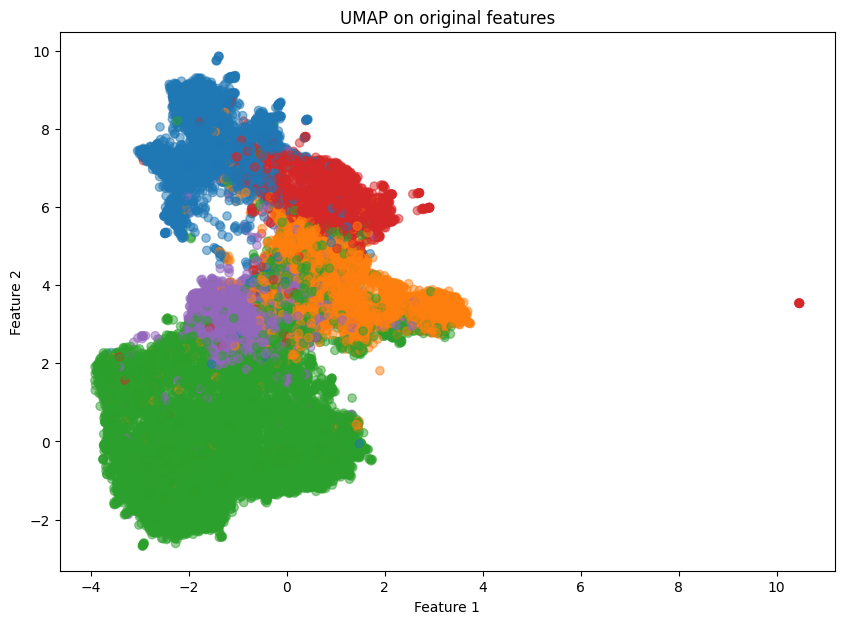

In [ ]:
umap_post = UMAP(n_components=2, random_state=0)
embeddings_umap_post = umap_post.fit_transform(data_x_cpu)

visualise(embeddings_umap_post, data_y_cpu, 'UMAP on original features')

### 4.2 Fine-tuning umap

#### 4.2.1 metric vs min_dist vs n_neighbors

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridd

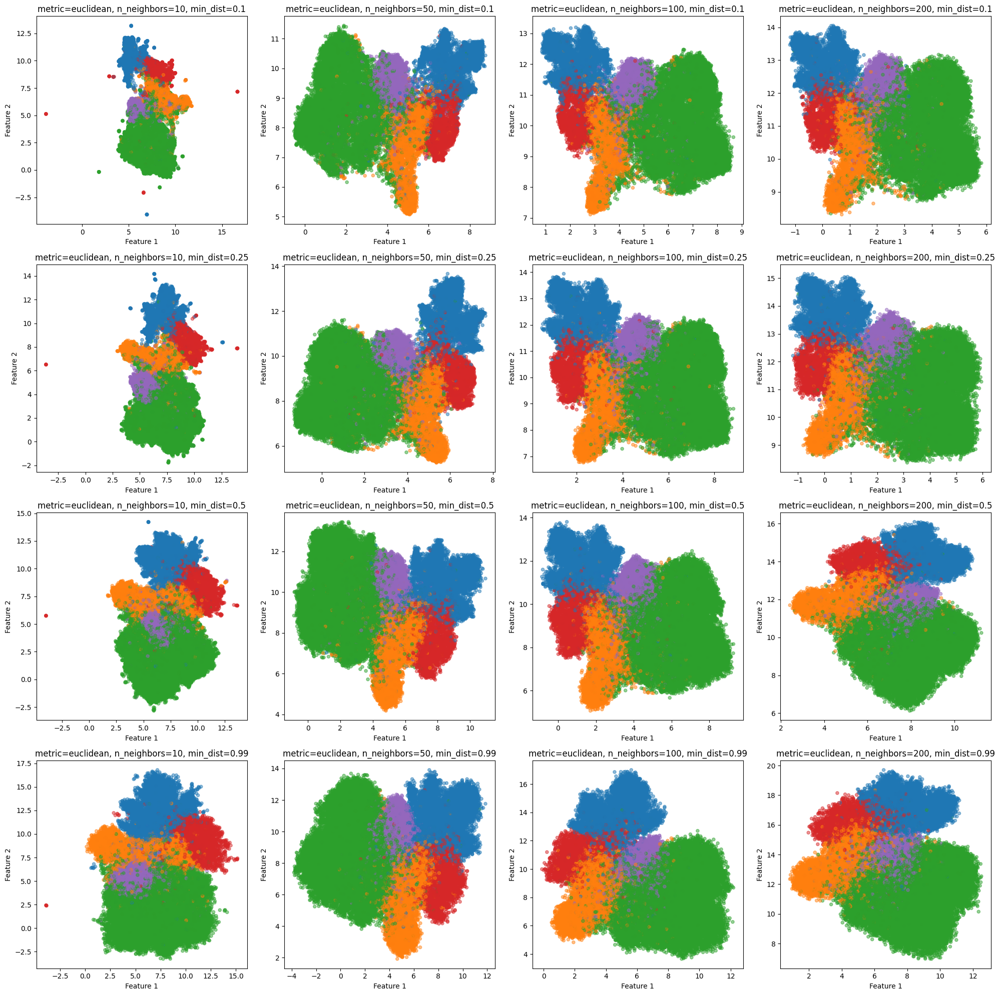

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridd

In [ ]:
for metric in ['euclidean', 'manhattan', 'cosine']:
    fig, axs = plt.subplots(4, 4, figsize=(20, 20))
    axs = axs.flatten()
    i = 0
    for min_dist in [0.1, 0.25, 0.5, 0.99]:
        for n_neighbors in [10, 50, 100, 200]:

            umap_post = UMAP(n_components=2, random_state=0, n_neighbors=n_neighbors, min_dist=min_dist, metric=metric)
            umap_results = umap_post.fit_transform(data_x_cpu)

            plot_no_show(axs[i], umap_results, data_y_cpu, f'metric={metric}, n_neighbors={n_neighbors}, min_dist={min_dist}', size=20)

            i += 1


    plt.tight_layout()
    plt.show()

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridd

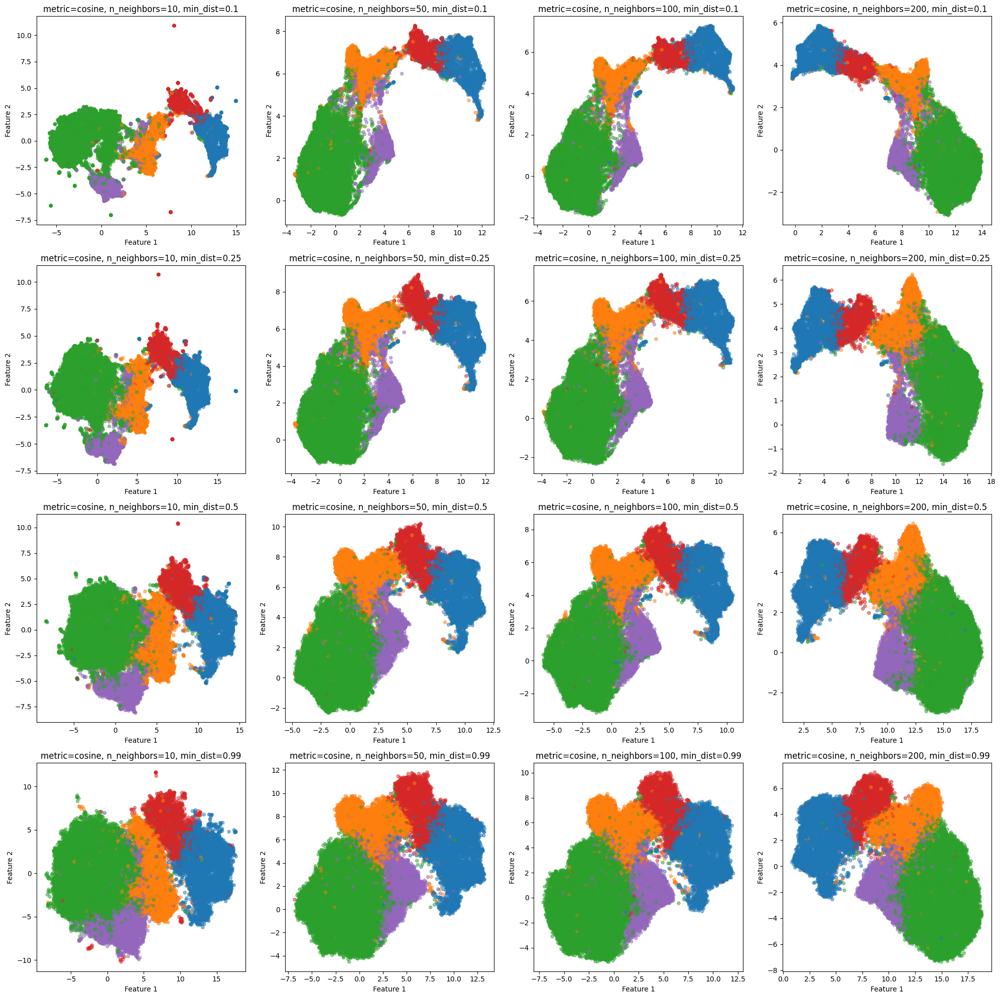

In [ ]:
for metric in ['cosine']:
    fig, axs = plt.subplots(4, 4, figsize=(20, 20))
    axs = axs.flatten()
    i = 0
    for min_dist in [0.1, 0.25, 0.5, 0.99]:
        for n_neighbors in [10, 50, 100, 200]:

            umap_post = UMAP(n_components=2, random_state=0, n_neighbors=n_neighbors, min_dist=min_dist, metric=metric)
            umap_results = umap_post.fit_transform(data_x_cpu)

            plot_no_show(axs[i], umap_results, data_y_cpu, f'metric={metric}, n_neighbors={n_neighbors}, min_dist={min_dist}', size=20)

            i += 1


    plt.tight_layout()
    plt.show()

The best metric is cosine. Min_dist=0.99 seems is beneficial, but let's investiagate further range of this parameter with greater frequency.

**n_neighbors=10** and **min_dist=0.1** proved to be the best parameters.

### 4.3 Fine-tuned UMAP vs default UMAP

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


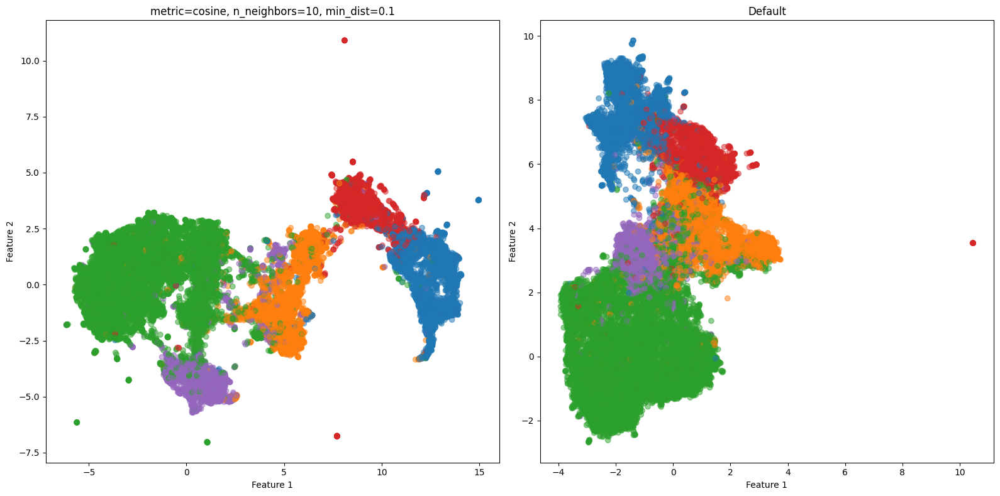

In [7]:
fig, axs = plt.subplots(1, 2, figsize=(16, 8))

metric='cosine'
n_neighbors=10
min_dist=0.1

umap_post = UMAP(n_components=2, random_state=0, n_neighbors=n_neighbors, min_dist=min_dist, metric=metric)
umap_results = umap_post.fit_transform(data_x_cpu)

plot_no_show(axs[0], umap_results, data_y_cpu, f'metric={metric}, n_neighbors={n_neighbors}, min_dist={min_dist}')

umap_post = UMAP(n_components=2, random_state=0)
umap_results = umap_post.fit_transform(data_x_cpu)

plot_no_show(axs[1], umap_results, data_y_cpu, f'Default')

plt.tight_layout()
plt.show()

## 5. UMAP on original features vs learned representations

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


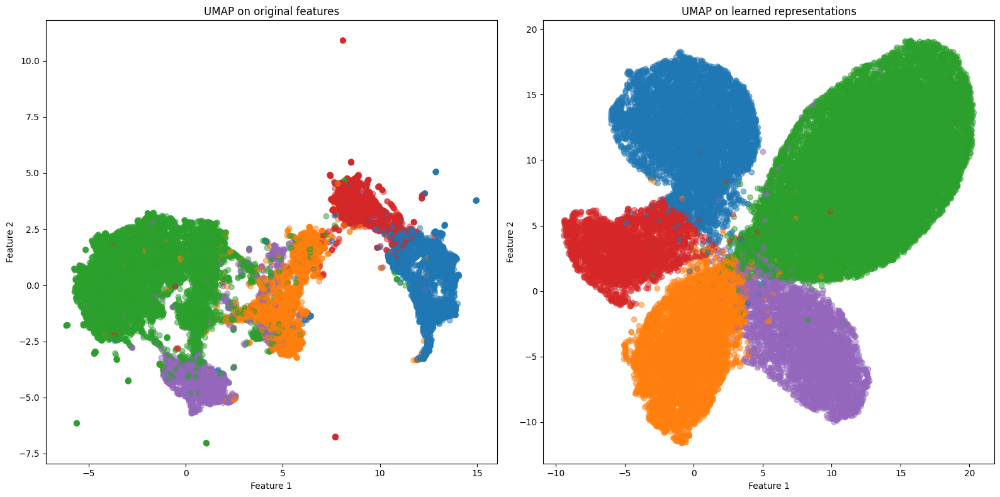

In [8]:
fig, axs = plt.subplots(1, 2, figsize=(16, 8))

metric='cosine'
n_neighbors=10
min_dist=0.1

umap_post = UMAP(n_components=2, random_state=0, n_neighbors=n_neighbors, min_dist=min_dist, metric=metric)
umap_results = umap_post.fit_transform(data_x_cpu)

plot_no_show(axs[0], umap_results, data_y_cpu, f'UMAP on original features')

metric='cosine'
n_neighbors=100
min_dist=0.9

umap_post = UMAP(n_components=2, random_state=0, n_neighbors=n_neighbors, min_dist=min_dist, metric=metric)
umap_results = umap_post.fit_transform(embeddings)

plot_no_show(axs[1], umap_results, data_y_cpu, f'UMAP on learned representations')

plt.tight_layout()
plt.show()

## 6. Final conclusions
**UMAP AS POSTPROCESSING STEP**

**Left plot: UMAP on original features**
- Feature overlap: There is a notable overlap among different classes, as indicated by the mingling of colors. This suggests that the original high-dimensional space does not easily allow for class separation.
- Global structure: UMAP has a tendency to maintain more of the global structure of the data compared to t-SNE, and this plot does show some broad groupings. However, the boundaries are not well-defined, which could imply that the original features alone may not be optimal for tasks that rely on clear class discrimination.


**Right plot: UMAP on learned representations**
- Improved clustering: The plot representing UMAP on the GNN's learned representations exhibits better clustering of similar data points (nodes). The colors representing different classes are more segregated into distinct clusters than in the original feature space.
- Class separation: The separation between clusters indicates that the GNN model is producing embeddings that encapsulate the structural and feature-related properties of the graph more effectively than the original features alone.
- Data manifold: The shape of the data distribution suggests that UMAP has captured a complex manifold where the GNN's learned representations reside. It indicates that the GNN has learned embeddings that reflect underlying data patterns conducive to node classification.


**UMAP AS PREPROCESSING STEP**
- UMAP applied as preprocessing step proved to be very fragile to fine-tuning.
- Default UMAP configuration performed very poorly, not exceeding 0.3 accuracy or other metrics values.
- Fine-tuned UMAP performed much better although the metrics still fell down by 5%.